In [1]:
import pandas as pd

### Figure 2: GS_LF data distribution of # of tasks with bins of active molecules

In [2]:
import pandas as pd 
from rdkit import Chem

gs_path = "../molecule_percept/goodscents/goodscents_molecule_percept.csv"
lf_path = "../molecule_percept/leffingwell/leffingwell_molecule_percept.csv"

gs = pd.read_csv(gs_path)
lf = pd.read_csv(lf_path)
# change to Int64 to preserve NaNs w/o padding w/ 0s.
gs.loc[:,'lovage':'tallow'] = gs.loc[:, 'lovage': 'tallow'].astype('Int64')
lf.loc[:,'alcoholic':'woody'] = lf.loc[:, 'alcoholic': 'woody'].astype('Int64')
gs_lf = pd.merge(gs, lf, on='IsomericSMILES', how='outer')
gs_lf = gs_lf.rename(columns={'Stimulus_x': 'Stimulus'})
gs_lf = gs_lf.drop(columns=['Stimulus_y'])
gs_lf = gs_lf.drop(columns=['Descriptors'])
gs_lf['IUPACName'] = gs_lf['IUPACName_x'].fillna(gs_lf['IUPACName_y'])
gs_lf.drop(columns=['IUPACName_x', 'IUPACName_y'], inplace=True)
gs_lf['name'] = gs_lf['name_x'].fillna(gs_lf['name_y'])
gs_lf.drop(columns=['name_x', 'name_y'], inplace=True)
for col in gs_lf.columns:
    if col.endswith('_x'):
        gs_lf[col[:-2]] = gs_lf[[col, col[:-2]+'_y']].max(axis=1)
        gs_lf = gs_lf.drop(columns=[col])
    elif col.endswith('_y'):
        gs_lf = gs_lf.drop(columns=[col])
gs_lf_deduplicated = gs_lf.drop_duplicates(subset=['IsomericSMILES'])
gs_lf_deduplicated = gs_lf_deduplicated[ ['IsomericSMILES'] + [ col for col in gs_lf_deduplicated.columns if col != 'IsomericSMILES' ] ]
for col in gs_lf_deduplicated.columns:
    if col not in ['IsomericSMILES', 'name', 'Stimulus', 'IUPACName', 'MolecularWeight', 'CID']:
        gs_lf_deduplicated[col] = gs_lf_deduplicated[col].astype('Int64')


gs_lf_deduplicated.drop(columns=['Stimulus', 'CID', 'IUPACName', 'MolecularWeight', 'name'], inplace=True)    


gs_lf_deduplicated


/tmp/ipykernel_1113779/1092692303.py:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  gs_lf[col[:-2]] = gs_lf[[col, col[:-2]+'_y']].max(axis=1)
/tmp/ipykernel_1113779/1092692303.py:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  gs_lf[col[:-2]] = gs_lf[[col, col[:-2]+'_y']].max(axis=1)
/tmp/ipykernel_1113779/1092692303.py:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axi

,IsomericSMILES,lovage,cloth laundered cloth,juniper,camphor,flowers,vegetables,cotton candy,charred,grain toasted grain,...,tomato,cherry,musk,vegetable,grassy,orange,hay,sour,sulfurous,apple
0,CC(=O)C1=CC=C(C=C1)OC,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
1,COC1=CC=C(C=C1)C(=O)O,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
2,C=CC1=CC=CC=C1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,C1=CC=C(C=C1)CO,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,C1=CC=C(C=C1)C=O,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5918,CCC1CSSSC1(CC)CC,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,...,0,0,0,0,0,0,0,0,0,0
5919,CC(S)SS,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,...,0,0,0,0,0,0,0,0,1,0
5920,CCC(C)C(=S)OCC(C)C,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,...,0,0,0,0,0,0,0,0,1,0
5921,CCCCCCCC=COC(=O)CCC,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,...,0,0,0,0,0,0,0,0,0,0


lovage
cloth laundered cloth
juniper
camphor
flowers
vegetables
cotton candy
charred
grain toasted grain
pulpy
citric
red
bland
lamb
acorn
chemical
shellfish
spearmint
cananga
ylang
painty
fish
cistus
catechu
fusel
clam
chrysanthemum
leather
banana ripe banana
sassafrass
bread baked
naphtha
grapfruit
cypress
dead
vinegar
bread crust
diffuse
linden flower
cinnamyl
pyrazine
mouldy
harsh
straw
orange rind
citral
cereal
citronella
ginger
agarwood
thujone
fungal
styrax
rosemary
blossom
peely
coumarin
bacon
forest
cornmint
cheese
plum skin
melon rind
rummy
nerol
parsley
balsam
menthol
bay
almond bitter almond
vetiver
sugar burnt sugar
petal
gourmand
orangeflower
rindy
caraway
strong
lactonic
sugar brown sugar
jammy
eucalyptus
starfruit
banana unripe banana
spinach
grass
grain
fig
almost odorless
peppermint
nutmeg
amine
carnation
spruce
citrus rind
sawdust
bonbon
seaweed
spice
lard
basil
elemi
rosy
freshly
loganberry
mercaptan
walnut
herbaceous
flower
pistachio
lilac
cardamom
elderflower
rasp

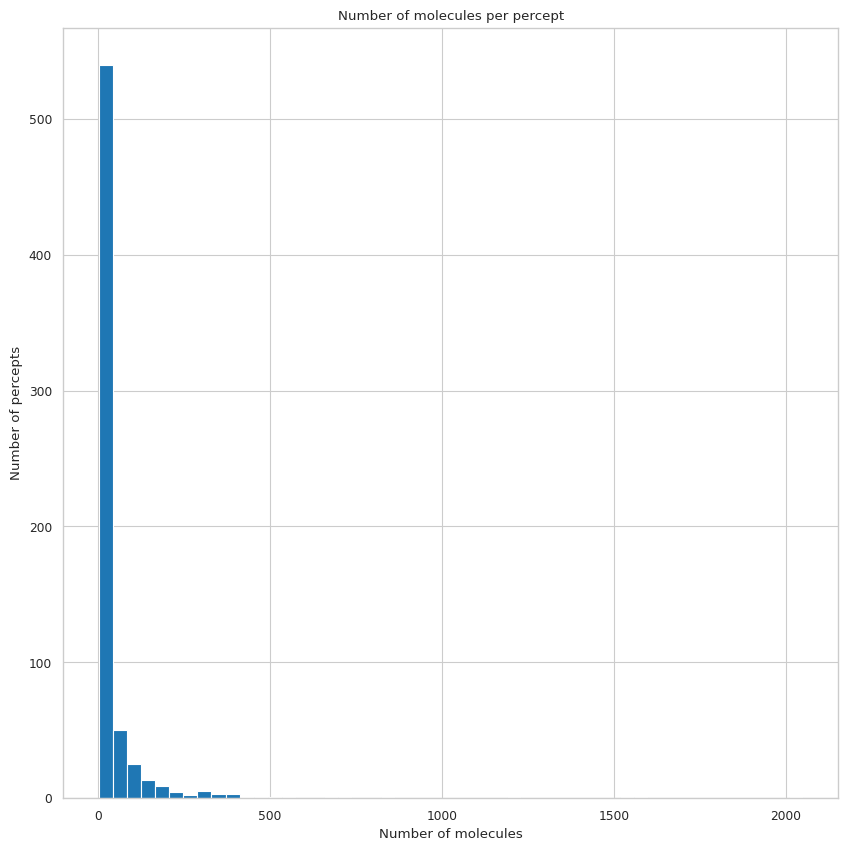

In [3]:
# plot histogram of number of molecules per percept, where y-axis is the number of percepts and x-axis is the number of molecules

percept_counts = {}
for col in gs_lf_deduplicated.columns:
    if col != 'IsomericSMILES':
        print(col)
        percept_counts[col] = gs_lf_deduplicated[col].value_counts().to_dict()

percept_counts_df = pd.DataFrame.from_dict(percept_counts, orient='index')


import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style("whitegrid")
sns.set_context("paper")
plt.figure(figsize=(10,10))
plt.hist(percept_counts_df[1].tolist(), bins=50)
plt.xlabel('Number of molecules')
plt.ylabel('Number of percepts')
plt.title('Number of molecules per percept')
plt.show()


bland
chemical
rummy
vetiver
orangeflower
lactonic
jammy
raspberry
minty
cooked
estery
amber
terpenic
bergamot
marine
celery
jasmin
cedar
natural
cooling
juicy
geranium
muguet
weedy
hawthorn
mild
brown
lavender
acidic
clean
ozone
bready
anise
lily
mentholic
clove
peppery
sandalwood
powdery
cortex
hyacinth
soapy
jasmine
apricot
herbal
chamomile
spicy
honey
cheesy
popcorn
ketonic
phenolic
musty
aromatic
pungent
coffee
alliaceous
balsamic
leathery
hazelnut
cucumber
radish
tropical
tobacco
cabbage
potato
metallic
cinnamon
tea
odorless
fatty
winey
chicken
strawberry
berry
orris
milky
buttery
ripe
chocolate
fishy
anisic
sharp
oily
violet
warm
melon
mint
leafy
smoky
burnt
solvent
fermented
lemon
grape
pear
plum
peach
citrus
brandy
nutty
rum
cognac
meaty
dairy
beefy
pineapple
animal
sweet
floral
camphoreous
coconut
malty
dry
earthy
onion
gasoline
brothy
pine
rose
roasted
grapefruit
fresh
garlic
caramellic
banana
coumarinic
savory
green
mushroom
waxy
aldehydic
woody
vanilla
fruity
horseradish
e

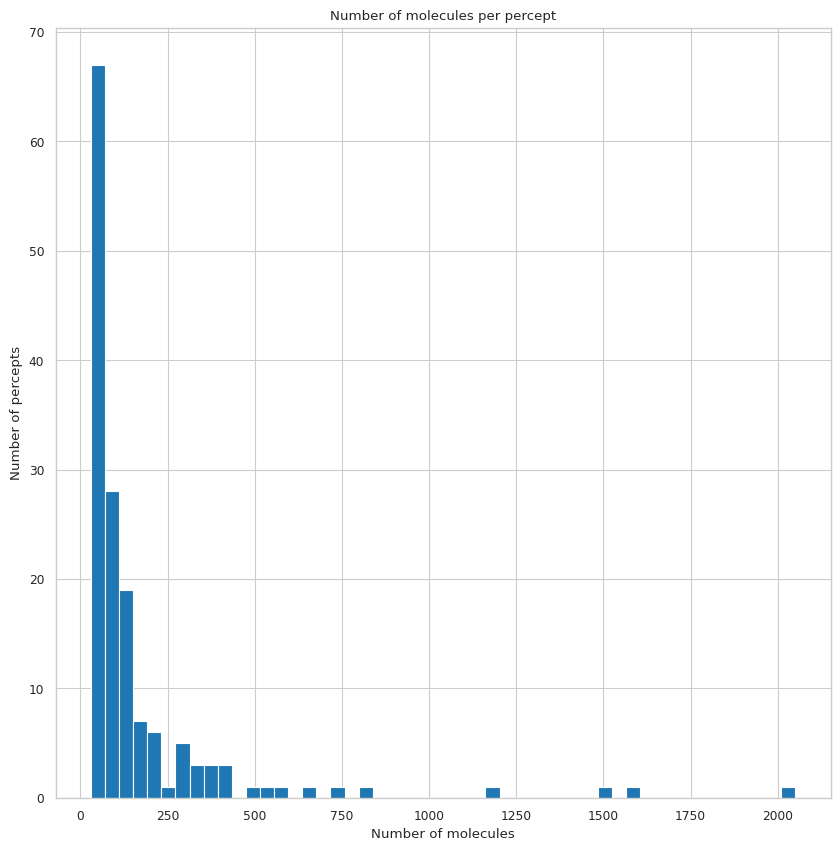

In [4]:
## filter to training dataset (only percepts with > 30 molecules)
# filter to percepts with > 30 molecules

## deep copy dataframe
gs_lf_deduplicated_drop_odors = gs_lf_deduplicated.copy(deep=True)


for col in gs_lf_deduplicated_drop_odors.columns:
    if col not in ['IsomericSMILES', 'name', 'Stimulus', 'IUPACName', 'MolecularWeight', 'CID']:
        ## Count the number of 1s in each column, if less than 10, drop the column
        if gs_lf_deduplicated_drop_odors[col].sum() < 30:
            gs_lf_deduplicated_drop_odors = gs_lf_deduplicated_drop_odors.drop(columns=[col])

gs_lf_deduplicated_drop_odors

percept_counts_filtered = {}
for col in gs_lf_deduplicated_drop_odors.columns:
    if col != 'IsomericSMILES':
        print(col)
        percept_counts_filtered[col] = gs_lf_deduplicated_drop_odors[col].value_counts().to_dict()

percept_counts_df_filtered = pd.DataFrame.from_dict(percept_counts_filtered, orient='index')


import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style("whitegrid")
sns.set_context("paper")
plt.figure(figsize=(10,10))
plt.hist(percept_counts_df_filtered[1].tolist(), bins=50)
## get which percept each bin corresponds to, given the row of the indices for each bin contains the percept

plt.xlabel('Number of molecules')
plt.ylabel('Number of percepts')
plt.title('Number of molecules per percept')
plt.show()



In [5]:
# get the rows of percept_counts_df_filtered that correspond to the bins with 450-500 molecules, where the 2nd column contains the number of molecules in each percept
percept_counts_df_filtered[(percept_counts_df_filtered[1] > 120) & (percept_counts_df_filtered[1] < 140)]

,0,1
alliaceous,5737,125
metallic,5725,137
mint,5739,123
leafy,5730,132
dairy,5739,123
animal,5735,127
garlic,5740,122
savory,5735,127
cocoa,5739,123


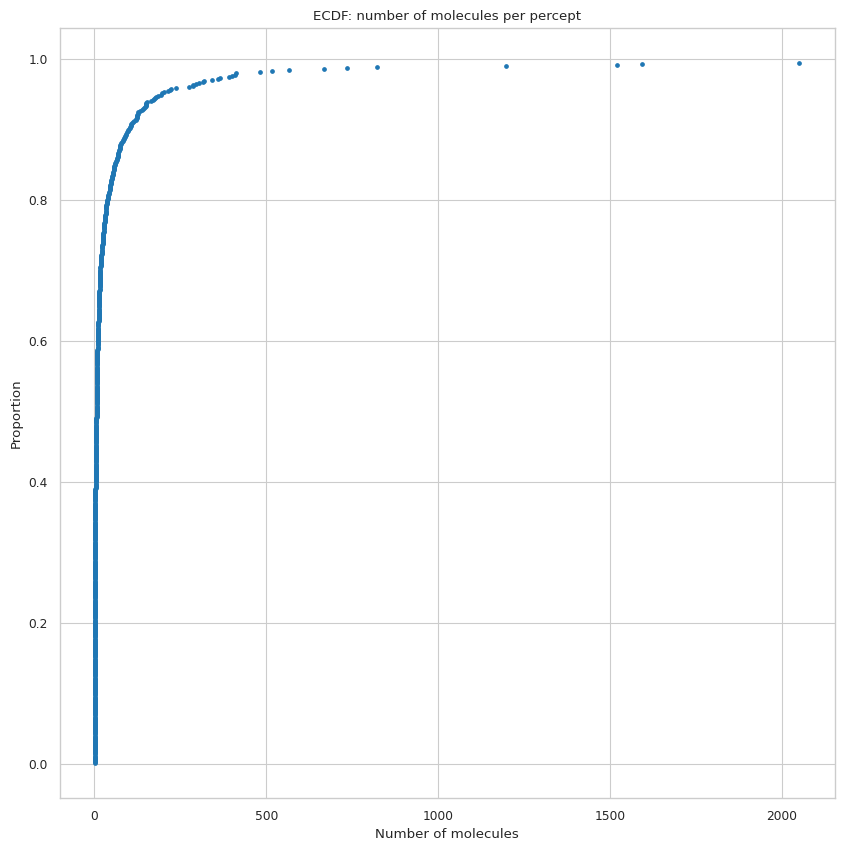

In [6]:
# plot ECDF of number of molecules per percept
import numpy as np
import matplotlib.pyplot as plt

def ecdf(data):
    """Compute ECDF for a one-dimensional array of measurements."""
    # Number of data points: n
    n = len(data)

    # x-data for the ECDF: x
    x = np.sort(data)

    # y-data for the ECDF: y
    y = np.arange(1, n+1) / n

    return x, y

x, y = ecdf(percept_counts_df[1].tolist())
plt.figure(figsize=(10,10))
plt.plot(x, y, marker='.', linestyle='none')
plt.xlabel('Number of molecules')
plt.ylabel('Proportion')
plt.title('ECDF: number of molecules per percept')
plt.show()


## M2OR data quality distribution

In [7]:
import pandas as pd
m2or = pd.read_csv("../data/datasets/M2OR_original_mol_OR_pairs.csv", sep=';')
m2or

,mol_id,seq_id,Responsive,_DataQuality,num_unique_value_screen,canonicalSMILES,mutated_Sequence
0,m_0,s_29,1,ec50,NaN,CC1=CCC(CC1)C(=C)C,MRENNQSSTLEFILLGVTGQQEQEDFFYILFLFIYPITLIGNLLIV...
1,m_0,s_449,1,ec50,NaN,CC1=CCC(CC1)C(=C)C,MDQSNYSSLHGFILLGFSNHPKMEMILSGVVAIFYLITLVGNTAII...
2,m_0,s_539,0,ec50,NaN,CC1=CCC(CC1)C(=C)C,MDQSNYSSLHGFILLGFSNHPKMEMILSGVVAIFYLITLVGNTAII...
3,m_1,s_1,1,ec50,NaN,CC1=CCC(CC1=O)C(=C)C,MTEDNYSLTTEFILIGFSDHPDLKILLFLVLSTIYLVTMVGNLGLV...
4,m_1,s_1051,0,ec50,NaN,CC1=CCC(CC1=O)C(=C)C,MREENESSTTDFTLLGVTRQREQEYFFFILFLFIYPITVFGNMLII...
...,...,...,...,...,...,...,...
46558,m_99,s_443,1,secondaryScreening,4.0,C1=CC=C(C=C1)OC2=CC=CC=C2,MRENNQSSTLEFILLGVTGQQEQEDFFYILFLFIYPITLIGNLLIV...
46559,m_99,s_444,0,secondaryScreening,4.0,C1=CC=C(C=C1)OC2=CC=CC=C2,MRENNQSSTLEFILLGVTGQQEQEDFFYILFLFIYPITLIGNLLIV...
46560,m_99,s_449,0,secondaryScreening,4.0,C1=CC=C(C=C1)OC2=CC=CC=C2,MDQSNYSSLHGFILLGFSNHPKMEMILSGVVAIFYLITLVGNTAII...
46561,m_99,s_450,0,secondaryScreening,4.0,C1=CC=C(C=C1)OC2=CC=CC=C2,MDEANHSVVSEFVFLGLSDSRKIQLLLFLFFSVFYVSSLMGNLLIV...


In [8]:
# Get percentage of each unique count in "_DataQuality" column
m2or['_DataQuality'].value_counts(normalize=True) * 100

_DataQuality
primaryScreening      71.279771
secondaryScreening    17.520349
ec50                  11.199880
Name: proportion, dtype: float64

## Tanimoto similarity matrix across tasks

In [9]:
# For each unique value in 'mol_id' column, get the value in 'canonicalSMILES' column
m2or_mols = m2or.groupby('mol_id')['canonicalSMILES'].first().values.tolist()


In [10]:
m2or['mol_id'].nunique(), m2or['seq_id'].nunique(), m2or['canonicalSMILES'].nunique()

(596, 1237, 543)

In [11]:
gs_lf_isomeric_smiles = gs_lf_deduplicated['IsomericSMILES'].unique().tolist()

In [12]:
def isomeric_to_canonical(smiles):
    ## Convert a list of isomeric SMILES, gs_lf_iso_SMILES to canonical SMILES, using RDKit
    from rdkit import Chem
    from rdkit.Chem import AllChem
    from rdkit.Chem import rdMolDescriptors
    canonical_SMILES = []
    for smi in smiles:
        mol = Chem.MolFromSmiles(smi)
        if mol is not None:
            canonical_SMILES.append(Chem.MolToSmiles(mol))
        else:
            canonical_SMILES.append(None)

    canonical_SMILES
    return canonical_SMILES

gs_lf_canonical = isomeric_to_canonical(gs_lf_isomeric_smiles)
m2or_canonical = isomeric_to_canonical(m2or_mols)

[02:48:57] WARNING: not removing hydrogen atom without neighbors
[02:48:57] WARNING: not removing hydrogen atom without neighbors
[02:48:57] WARNING: not removing hydrogen atom without neighbors
[02:48:57] WARNING: not removing hydrogen atom without neighbors
[02:48:57] WARNING: not removing hydrogen atom without neighbors
[02:48:57] WARNING: not removing hydrogen atom without neighbors
[02:48:57] WARNING: not removing hydrogen atom without neighbors
[02:48:57] WARNING: not removing hydrogen atom without neighbors
[02:48:57] WARNING: not removing hydrogen atom without neighbors
[02:48:57] WARNING: not removing hydrogen atom without neighbors
[02:48:57] WARNING: not removing hydrogen atom without neighbors
[02:48:57] WARNING: not removing hydrogen atom without neighbors
[02:48:57] WARNING: not removing hydrogen atom without neighbors
[02:48:57] WARNING: not removing hydrogen atom without neighbors
[02:48:57] WARNING: not removing hydrogen atom without neighbors
[02:48:57] WARNING: not r

In [33]:
# list number of None values in canonical SMILES
print(gs_lf_canonical.count(None))
print(m2or_canonical.count(None))

len(gs_lf_canonical), len(m2or_canonical)

0
0


(5862, 543)

In [43]:
from rdkit.Chem.Fingerprints import FingerprintMols
from rdkit import DataStructs

def tanimoto_similarity(ind_SMILES, canonical_SMILES):
    tanimoto_sim = []
    for ind_smi in ind_SMILES:
        ind_mol = Chem.MolFromSmiles(ind_smi)
        if ind_mol is not None:
            ind_fp = FingerprintMols.FingerprintMol(ind_mol)
            tanimoto_sim.append([DataStructs.FingerprintSimilarity(ind_fp, FingerprintMols.FingerprintMol(Chem.MolFromSmiles(can_smi))) for can_smi in canonical_SMILES])
        else:
            tanimoto_sim.append([None for can_smi in canonical_SMILES])
    return tanimoto_sim

m2or_gs_lf_tanimoto_sim = tanimoto_similarity(gs_lf_canonical, m2or_canonical)

[00:05:15] WARNING: not removing hydrogen atom without neighbors
[00:05:15] WARNING: not removing hydrogen atom without neighbors
[00:05:15] WARNING: not removing hydrogen atom without neighbors
[00:05:15] WARNING: not removing hydrogen atom without neighbors
[00:05:15] WARNING: not removing hydrogen atom without neighbors
[00:05:15] WARNING: not removing hydrogen atom without neighbors
[00:05:15] WARNING: not removing hydrogen atom without neighbors
[00:05:15] WARNING: not removing hydrogen atom without neighbors
[00:05:15] WARNING: not removing hydrogen atom without neighbors
[00:05:15] WARNING: not removing hydrogen atom without neighbors
[00:05:15] WARNING: not removing hydrogen atom without neighbors
[00:05:15] WARNING: not removing hydrogen atom without neighbors
[00:05:15] WARNING: not removing hydrogen atom without neighbors
[00:05:15] WARNING: not removing hydrogen atom without neighbors
[00:05:15] WARNING: not removing hydrogen atom without neighbors
[00:05:15] WARNING: not r

In [44]:
m2or_all_by_all = tanimoto_similarity(m2or_canonical, m2or_canonical)

[00:18:46] WARNING: not removing hydrogen atom without neighbors
[00:18:46] WARNING: not removing hydrogen atom without neighbors
[00:18:46] WARNING: not removing hydrogen atom without neighbors
[00:18:46] WARNING: not removing hydrogen atom without neighbors
[00:18:46] WARNING: not removing hydrogen atom without neighbors
[00:18:46] WARNING: not removing hydrogen atom without neighbors
[00:18:46] WARNING: not removing hydrogen atom without neighbors
[00:18:46] WARNING: not removing hydrogen atom without neighbors
[00:18:46] WARNING: not removing hydrogen atom without neighbors
[00:18:46] WARNING: not removing hydrogen atom without neighbors
[00:18:46] WARNING: not removing hydrogen atom without neighbors
[00:18:46] WARNING: not removing hydrogen atom without neighbors
[00:18:46] WARNING: not removing hydrogen atom without neighbors
[00:18:46] WARNING: not removing hydrogen atom without neighbors
[00:18:46] WARNING: not removing hydrogen atom without neighbors
[00:18:46] WARNING: not r

In [48]:
# count the number of non-diagonal elements that have an exact similarity of 1
count_gs_lf_m2or = []
for i in range(len(m2or_gs_lf_tanimoto_sim)):
    for j in range(len(m2or_gs_lf_tanimoto_sim[i])):
        if i != j and m2or_gs_lf_tanimoto_sim[i][j] == 1:
            count_gs_lf_m2or.append((i, j))

count_gs_lf_m2or

[(3, 284),
 (4, 361),
 (5, 280),
 (6, 83),
 (12, 52),
 (12, 109),
 (12, 110),
 (12, 113),
 (12, 224),
 (12, 336),
 (12, 342),
 (12, 345),
 (12, 347),
 (12, 348),
 (12, 349),
 (12, 423),
 (12, 446),
 (12, 457),
 (12, 490),
 (12, 523),
 (49, 529),
 (54, 595),
 (55, 425),
 (56, 429),
 (57, 259),
 (65, 232),
 (79, 151),
 (90, 273),
 (92, 255),
 (96, 204),
 (101, 234),
 (107, 76),
 (107, 315),
 (108, 427),
 (109, 524),
 (110, 311),
 (111, 247),
 (125, 186),
 (126, 164),
 (127, 511),
 (128, 236),
 (131, 161),
 (131, 162),
 (131, 163),
 (131, 165),
 (135, 161),
 (135, 162),
 (135, 163),
 (135, 165),
 (136, 352),
 (139, 551),
 (144, 126),
 (144, 127),
 (144, 324),
 (144, 412),
 (153, 141),
 (153, 570),
 (154, 49),
 (154, 517),
 (160, 21),
 (160, 299),
 (168, 47),
 (168, 333),
 (168, 401),
 (168, 434),
 (168, 534),
 (168, 592),
 (178, 456),
 (182, 254),
 (183, 182),
 (185, 405),
 (186, 188),
 (192, 7),
 (192, 104),
 (196, 3),
 (212, 465),
 (212, 488),
 (217, 141),
 (217, 570),
 (222, 87),
 (222

In [75]:
gs_lf_canonical[2812], m2or_canonical[404]

('CCCCCCCCCCCCCCCC(=O)O', 'O=C(O)CCCCCCCCCC(=O)O')

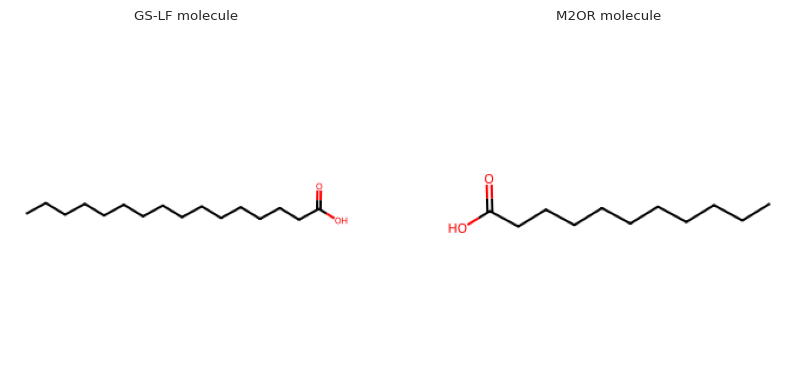

In [79]:
def plot_2_mols(smi1, smi2):
    # plot the above two molecules as images

    from rdkit.Chem import Draw
    from rdkit.Chem import AllChem

    mol1 = Chem.MolFromSmiles(smi1)
    mol2 = Chem.MolFromSmiles(smi2)

    img1 = Draw.MolToImage(mol1)
    img2 = Draw.MolToImage(mol2)

    # plot side by side
    fig, ax = plt.subplots(1, 2, figsize=(10, 10))
    ax[0].imshow(img1)
    ax[0].axis('off')
    ax[0].set_title('GS-LF molecule')
    ax[1].imshow(img2)
    ax[1].axis('off')
    ax[1].set_title('M2OR molecule')
    plt.show()


plot_2_mols(gs_lf_canonical[2812], m2or_canonical[410])

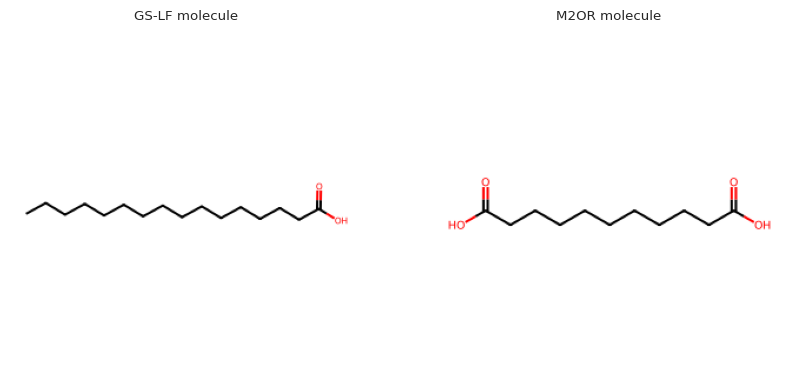

In [82]:
plot_2_mols(gs_lf_canonical[2812], m2or_canonical[404])

In [81]:
# compute tanimoto_sim between the two molecules above

mol1 = Chem.MolFromSmiles(gs_lf_canonical[2812])
mol2 = Chem.MolFromSmiles(m2or_canonical[404])

fp1 = FingerprintMols.FingerprintMol(mol1)
fp2 = FingerprintMols.FingerprintMol(mol2)

DataStructs.FingerprintSimilarity(fp1, fp2)


1.0

In [61]:
def overlapping_compounds(sim_matrix, threshold = 1):
    # Find rows and columns with at least one similarity score above the threshold
    overlapping_rows = np.any(sim_matrix == threshold, axis=-1)
    overlapping_columns = np.any(sim_matrix == threshold, axis=0)

    # Count the number of overlapping rows and columns
    num_overlapping_rows = np.sum(overlapping_rows)
    num_overlapping_columns = np.sum(overlapping_columns)

    # Display the results
    num_overlapping_rows, num_overlapping_columns
    return num_overlapping_rows, num_overlapping_columns

overlapping_compounds(np.array(m2or_all_by_all), 1)

(543, 543)

In [45]:
# convert to numpy 2d array
m2or_gs_lf_tanimoto_sim_np = np.array(m2or_gs_lf_tanimoto_sim)
m2or_gs_lf_tanimoto_sim_np.shape

(5862, 596)

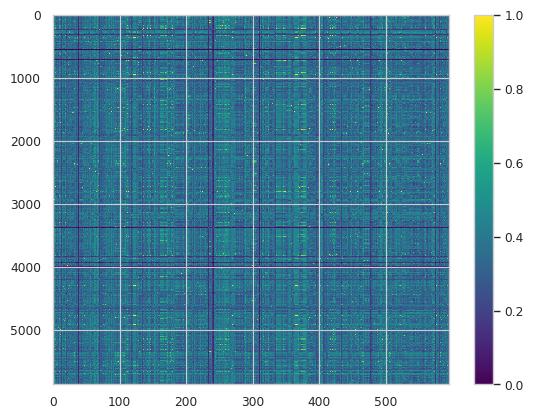

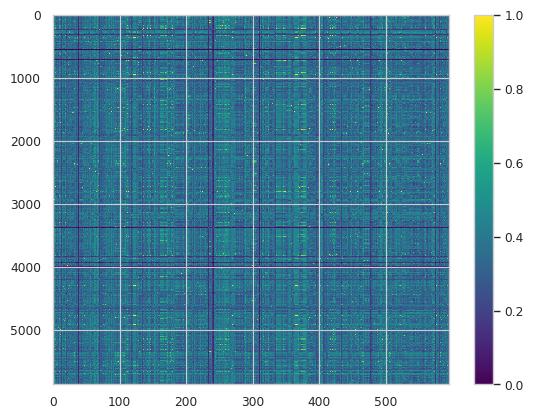

In [46]:
import matplotlib.pyplot as plt

plt.imshow(m2or_gs_lf_tanimoto_sim_np, aspect='auto', interpolation='none', cmap='viridis')
plt.colorbar()
plt.show()


plt.imshow(m2or_gs_lf_tanimoto_sim_np, aspect='auto', interpolation='nearest', cmap='viridis')
plt.colorbar()
plt.show()


In [47]:
## find # of exact matches 
np.count_nonzero(m2or_gs_lf_tanimoto_sim_np == 1)

1813

In [1]:
import numpy as np

## read in sim_matrix
sim_matrix = np.load("M2OR_GS_LF_tanimoto_sim_matrix.npy")
sim_matrix.shape

(766, 5862)

In [2]:
## find # of exact matches 
np.count_nonzero(sim_matrix == 1)

2125

In [3]:
sim_matrix.shape

(766, 5862)

In [58]:
threshold = 1

# Find rows and columns with at least one similarity score above the threshold
overlapping_rows = np.any(sim_matrix == threshold, axis=-1)
overlapping_columns = np.any(sim_matrix == threshold, axis=0)

# Count the number of overlapping rows and columns
num_overlapping_rows = np.sum(overlapping_rows)
num_overlapping_columns = np.sum(overlapping_columns)

# Display the results
num_overlapping_rows, num_overlapping_columns


(633, 973)

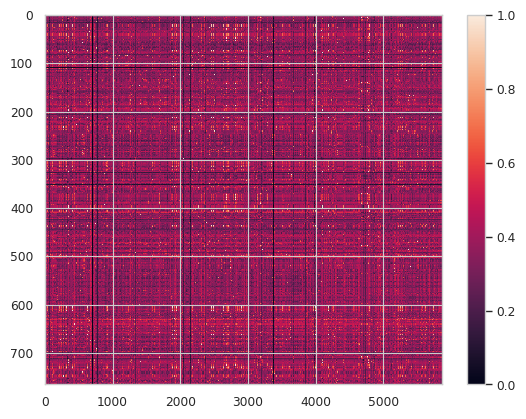

In [49]:
# plot the matrix, but make the x-axis and y-axis the same size even though there are more columns then rows

import matplotlib.pyplot as plt

#plt.imshow(sim_matrix, interpolation="nearest", origin="upper")
plt.imshow(sim_matrix, aspect='auto', interpolation='nearest', origin = "upper")

plt.colorbar()
plt.show()

